In [1]:
from __future__ import division
from numpy.random import randn
import numpy as np
import os
import matplotlib.pyplot as plt
np.random.seed(12345)
plt.rc('figure', figsize=(10, 6))
from pandas import Series, DataFrame
import pandas
import pandas as pd
np.set_printoptions(precision=4, threshold=500)
pd.options.display.max_rows = 100
import json

# 책 예제

In [2]:
db = json.load(open('ch07/foods-2011-10-03.json'))
len(db)

6636

In [3]:
db[0].keys()

dict_keys(['id', 'description', 'tags', 'manufacturer', 'group', 'portions', 'nutrients'])

In [4]:
db[0]['nutrients'][0]

{'description': 'Protein',
 'group': 'Composition',
 'units': 'g',
 'value': 25.18}

In [5]:
nutrients = DataFrame(db[0]['nutrients'])
nutrients[:7]

,description,group,units,value
0,Protein,Composition,g,25.18
1,Total lipid (fat),Composition,g,29.20
2,"Carbohydrate, by difference",Composition,g,3.06
3,Ash,Other,g,3.28
4,Energy,Energy,kcal,376.00
5,Water,Composition,g,39.28
6,Energy,Energy,kJ,1573.00


In [6]:
info_keys = ['description', 'group', 'id', 'manufacturer']
info = DataFrame(db, columns=info_keys)
info[:5]

,description,group,id,manufacturer
0,"Cheese, caraway",Dairy and Egg Products,1008,
1,"Cheese, cheddar",Dairy and Egg Products,1009,
2,"Cheese, edam",Dairy and Egg Products,1018,
3,"Cheese, feta",Dairy and Egg Products,1019,
4,"Cheese, mozzarella, part skim milk",Dairy and Egg Products,1028,


In [7]:
info

,description,group,id,manufacturer
0,"Cheese, caraway",Dairy and Egg Products,1008,
1,"Cheese, cheddar",Dairy and Egg Products,1009,
2,"Cheese, edam",Dairy and Egg Products,1018,
3,"Cheese, feta",Dairy and Egg Products,1019,
4,"Cheese, mozzarella, part skim milk",Dairy and Egg Products,1028,
5,"Cheese, mozzarella, part skim milk, low moisture",Dairy and Egg Products,1029,
6,"Cheese, romano",Dairy and Egg Products,1038,
7,"Cheese, roquefort",Dairy and Egg Products,1039,
8,"Cheese spread, pasteurized process, american, ...",Dairy and Egg Products,1048,
9,"Cream, fluid, half and half",Dairy and Egg Products,1049,


In [8]:
pd.value_counts(info.group)[:10]

Vegetables and Vegetable Products    812
Beef Products                        618
Baked Products                       496
Breakfast Cereals                    403
Fast Foods                           365
Legumes and Legume Products          365
Lamb, Veal, and Game Products        345
Sweets                               341
Fruits and Fruit Juices              328
Pork Products                        328
Name: group, dtype: int64

In [9]:
nutrients = []

for rec in db:
    fnuts = DataFrame(rec['nutrients'])
    fnuts['id'] = rec['id']
    nutrients.append(fnuts)

nutrients = pd.concat(nutrients, ignore_index=True)
nutrients

,description,group,units,value,id
0,Protein,Composition,g,25.180,1008
1,Total lipid (fat),Composition,g,29.200,1008
2,"Carbohydrate, by difference",Composition,g,3.060,1008
3,Ash,Other,g,3.280,1008
4,Energy,Energy,kcal,376.000,1008
5,Water,Composition,g,39.280,1008
6,Energy,Energy,kJ,1573.000,1008
7,"Fiber, total dietary",Composition,g,0.000,1008
8,"Calcium, Ca",Elements,mg,673.000,1008
9,"Iron, Fe",Elements,mg,0.640,1008


In [10]:
nutrients.duplicated().sum()

14179

In [11]:
nutrients = nutrients.drop_duplicates()
col_mapping = {'description' : 'food',
               'group'       : 'fgroup'}
info = info.rename(columns=col_mapping, copy=False)
info

,food,fgroup,id,manufacturer
0,"Cheese, caraway",Dairy and Egg Products,1008,
1,"Cheese, cheddar",Dairy and Egg Products,1009,
2,"Cheese, edam",Dairy and Egg Products,1018,
3,"Cheese, feta",Dairy and Egg Products,1019,
4,"Cheese, mozzarella, part skim milk",Dairy and Egg Products,1028,
5,"Cheese, mozzarella, part skim milk, low moisture",Dairy and Egg Products,1029,
6,"Cheese, romano",Dairy and Egg Products,1038,
7,"Cheese, roquefort",Dairy and Egg Products,1039,
8,"Cheese spread, pasteurized process, american, ...",Dairy and Egg Products,1048,
9,"Cream, fluid, half and half",Dairy and Egg Products,1049,


In [12]:
col_mapping = {'description' : 'nutrient',
               'group' : 'nutgroup'}
nutrients = nutrients.rename(columns=col_mapping, copy=False)
nutrients

,nutrient,nutgroup,units,value,id
0,Protein,Composition,g,25.180,1008
1,Total lipid (fat),Composition,g,29.200,1008
2,"Carbohydrate, by difference",Composition,g,3.060,1008
3,Ash,Other,g,3.280,1008
4,Energy,Energy,kcal,376.000,1008
5,Water,Composition,g,39.280,1008
6,Energy,Energy,kJ,1573.000,1008
7,"Fiber, total dietary",Composition,g,0.000,1008
8,"Calcium, Ca",Elements,mg,673.000,1008
9,"Iron, Fe",Elements,mg,0.640,1008


In [13]:
col_mapping = {'description' : 'nutrient',
               'group' : 'nutgroup'}
nutrients = nutrients.rename(columns=col_mapping, copy=False)
nutrients

,nutrient,nutgroup,units,value,id
0,Protein,Composition,g,25.180,1008
1,Total lipid (fat),Composition,g,29.200,1008
2,"Carbohydrate, by difference",Composition,g,3.060,1008
3,Ash,Other,g,3.280,1008
4,Energy,Energy,kcal,376.000,1008
5,Water,Composition,g,39.280,1008
6,Energy,Energy,kJ,1573.000,1008
7,"Fiber, total dietary",Composition,g,0.000,1008
8,"Calcium, Ca",Elements,mg,673.000,1008
9,"Iron, Fe",Elements,mg,0.640,1008


In [14]:
ndata = pd.merge(nutrients, info, on='id', how='outer')
ndata

,nutrient,nutgroup,units,value,id,food,fgroup,manufacturer
0,Protein,Composition,g,25.180,1008,"Cheese, caraway",Dairy and Egg Products,
1,Total lipid (fat),Composition,g,29.200,1008,"Cheese, caraway",Dairy and Egg Products,
2,"Carbohydrate, by difference",Composition,g,3.060,1008,"Cheese, caraway",Dairy and Egg Products,
3,Ash,Other,g,3.280,1008,"Cheese, caraway",Dairy and Egg Products,
4,Energy,Energy,kcal,376.000,1008,"Cheese, caraway",Dairy and Egg Products,
5,Water,Composition,g,39.280,1008,"Cheese, caraway",Dairy and Egg Products,
6,Energy,Energy,kJ,1573.000,1008,"Cheese, caraway",Dairy and Egg Products,
7,"Fiber, total dietary",Composition,g,0.000,1008,"Cheese, caraway",Dairy and Egg Products,
8,"Calcium, Ca",Elements,mg,673.000,1008,"Cheese, caraway",Dairy and Egg Products,
9,"Iron, Fe",Elements,mg,0.640,1008,"Cheese, caraway",Dairy and Egg Products,


In [15]:
ndata.ix[30000]

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  """Entry point for launching an IPython kernel.


nutrient                                       Glycine
nutgroup                                   Amino Acids
units                                                g
value                                             0.04
id                                                6158
food            Soup, tomato bisque, canned, condensed
fgroup                      Soups, Sauces, and Gravies
manufacturer                                          
Name: 30000, dtype: object

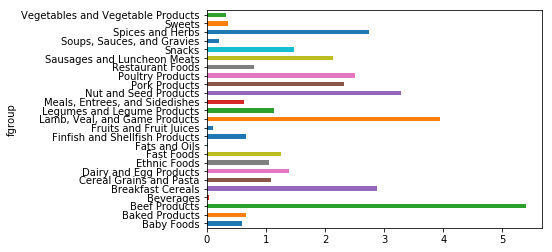

In [16]:
result = ndata.groupby(['nutrient', 'fgroup'])['value'].quantile(0.5)
result['Zinc, Zn'].plot(kind='barh')

In [17]:
by_nutrient = ndata.groupby(['nutgroup', 'nutrient'])

get_maximum = lambda x: x.xs(x.value.idxmax())
get_minimum = lambda x: x.xs(x.value.idxmin())

max_foods = by_nutrient.apply(get_maximum)[['value', 'food']]

# make the food a little smaller
max_foods.food = max_foods.food.str[:50]
max_foods.ix['Amino Acids']['food']

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  # Remove the CWD from sys.path while we load stuff.


nutrient
Alanine                           Gelatins, dry powder, unsweetened
Arginine                               Seeds, sesame flour, low-fat
Aspartic acid                                   Soy protein isolate
Cystine                Seeds, cottonseed flour, low fat (glandless)
Glutamic acid                                   Soy protein isolate
Glycine                           Gelatins, dry powder, unsweetened
Histidine                Whale, beluga, meat, dried (Alaska Native)
Hydroxyproline    KENTUCKY FRIED CHICKEN, Fried Chicken, ORIGINA...
Isoleucine        Soy protein isolate, PROTEIN TECHNOLOGIES INTE...
Leucine           Soy protein isolate, PROTEIN TECHNOLOGIES INTE...
Lysine            Seal, bearded (Oogruk), meat, dried (Alaska Na...
Methionine                    Fish, cod, Atlantic, dried and salted
Phenylalanine     Soy protein isolate, PROTEIN TECHNOLOGIES INTE...
Proline                           Gelatins, dry powder, unsweetened
Serine            Soy protein isolate, 

# EX 1)

In [18]:
db[0].keys()

dict_keys(['id', 'description', 'tags', 'manufacturer', 'group', 'portions', 'nutrients'])

In [19]:
db[0]['nutrients'][0]

{'description': 'Protein',
 'group': 'Composition',
 'units': 'g',
 'value': 25.18}

In [20]:
portions = DataFrame(db[0]['portions'])
portions[:5]

,amount,grams,unit
0,1,28.35,oz


In [21]:
ex1_keys = [ 'id', 'group','description','manufacturer']
ex1_info = DataFrame(db, columns=ex1_keys)
ex1_info

,id,group,description,manufacturer
0,1008,Dairy and Egg Products,"Cheese, caraway",
1,1009,Dairy and Egg Products,"Cheese, cheddar",
2,1018,Dairy and Egg Products,"Cheese, edam",
3,1019,Dairy and Egg Products,"Cheese, feta",
4,1028,Dairy and Egg Products,"Cheese, mozzarella, part skim milk",
5,1029,Dairy and Egg Products,"Cheese, mozzarella, part skim milk, low moisture",
6,1038,Dairy and Egg Products,"Cheese, romano",
7,1039,Dairy and Egg Products,"Cheese, roquefort",
8,1048,Dairy and Egg Products,"Cheese spread, pasteurized process, american, ...",
9,1049,Dairy and Egg Products,"Cream, fluid, half and half",


In [29]:
portions = []

for rec_ex1 in db:
    fnuts_ex1 = DataFrame(rec_ex1['portions'])
    fnuts_ex1['id'] = rec_ex1['id']
    portions.append(fnuts_ex1)

portions = pd.concat(portions, ignore_index=True)
portions

,amount,grams,id,unit
0,1.0,28.35,1008,oz
1,1.0,132.00,1009,"cup, diced"
2,2.0,244.00,1009,"cup, melted"
3,3.0,113.00,1009,"cup, shredded"
4,4.0,28.35,1009,oz
5,5.0,17.00,1009,cubic inch
6,6.0,28.00,1009,slice (1 oz)
7,1.0,28.35,1018,oz
8,2.0,198.00,1018,package (7 oz)
9,1.0,150.00,1019,"cup, crumbled"


In [30]:
portions.duplicated().sum()

0

In [24]:
portions = portions.drop_duplicates()
col_mapping = {'description' : 'food',
               'group'       : 'fgroup'}
ex1_info = ex1_info.rename(columns=col_mapping, copy=False)
ex1_info

,id,fgroup,food,manufacturer
0,1008,Dairy and Egg Products,"Cheese, caraway",
1,1009,Dairy and Egg Products,"Cheese, cheddar",
2,1018,Dairy and Egg Products,"Cheese, edam",
3,1019,Dairy and Egg Products,"Cheese, feta",
4,1028,Dairy and Egg Products,"Cheese, mozzarella, part skim milk",
5,1029,Dairy and Egg Products,"Cheese, mozzarella, part skim milk, low moisture",
6,1038,Dairy and Egg Products,"Cheese, romano",
7,1039,Dairy and Egg Products,"Cheese, roquefort",
8,1048,Dairy and Egg Products,"Cheese spread, pasteurized process, american, ...",
9,1049,Dairy and Egg Products,"Cream, fluid, half and half",


In [25]:
pdata = pd.merge(portions, ex1_info, on='id', how='outer')
pdata
#11144번째까지 유효

,amount,grams,id,unit,fgroup,food,manufacturer
0,1.0,28.35,1008,oz,Dairy and Egg Products,"Cheese, caraway",
1,1.0,132.00,1009,"cup, diced",Dairy and Egg Products,"Cheese, cheddar",
2,2.0,244.00,1009,"cup, melted",Dairy and Egg Products,"Cheese, cheddar",
3,3.0,113.00,1009,"cup, shredded",Dairy and Egg Products,"Cheese, cheddar",
4,4.0,28.35,1009,oz,Dairy and Egg Products,"Cheese, cheddar",
5,5.0,17.00,1009,cubic inch,Dairy and Egg Products,"Cheese, cheddar",
6,6.0,28.00,1009,slice (1 oz),Dairy and Egg Products,"Cheese, cheddar",
7,1.0,28.35,1018,oz,Dairy and Egg Products,"Cheese, edam",
8,2.0,198.00,1018,package (7 oz),Dairy and Egg Products,"Cheese, edam",
9,1.0,150.00,1019,"cup, crumbled",Dairy and Egg Products,"Cheese, feta",


In [26]:
pdata.ix[:11144]

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  """Entry point for launching an IPython kernel.


,amount,grams,id,unit,fgroup,food,manufacturer
0,1.0,28.35,1008,oz,Dairy and Egg Products,"Cheese, caraway",
1,1.0,132.00,1009,"cup, diced",Dairy and Egg Products,"Cheese, cheddar",
2,2.0,244.00,1009,"cup, melted",Dairy and Egg Products,"Cheese, cheddar",
3,3.0,113.00,1009,"cup, shredded",Dairy and Egg Products,"Cheese, cheddar",
4,4.0,28.35,1009,oz,Dairy and Egg Products,"Cheese, cheddar",
5,5.0,17.00,1009,cubic inch,Dairy and Egg Products,"Cheese, cheddar",
6,6.0,28.00,1009,slice (1 oz),Dairy and Egg Products,"Cheese, cheddar",
7,1.0,28.35,1018,oz,Dairy and Egg Products,"Cheese, edam",
8,2.0,198.00,1018,package (7 oz),Dairy and Egg Products,"Cheese, edam",
9,1.0,150.00,1019,"cup, crumbled",Dairy and Egg Products,"Cheese, feta",


In [27]:
pdata_key= [ 'id','fgroup', 'amount','food','grams','unit','manufacturer']
pdata = DataFrame(pdata, columns=pdata_key)
pdata[:500]

,id,fgroup,amount,food,grams,unit,manufacturer
0,1008,Dairy and Egg Products,1.0,"Cheese, caraway",28.35,oz,
1,1009,Dairy and Egg Products,1.0,"Cheese, cheddar",132.00,"cup, diced",
2,1009,Dairy and Egg Products,2.0,"Cheese, cheddar",244.00,"cup, melted",
3,1009,Dairy and Egg Products,3.0,"Cheese, cheddar",113.00,"cup, shredded",
4,1009,Dairy and Egg Products,4.0,"Cheese, cheddar",28.35,oz,
5,1009,Dairy and Egg Products,5.0,"Cheese, cheddar",17.00,cubic inch,
6,1009,Dairy and Egg Products,6.0,"Cheese, cheddar",28.00,slice (1 oz),
7,1018,Dairy and Egg Products,1.0,"Cheese, edam",28.35,oz,
8,1018,Dairy and Egg Products,2.0,"Cheese, edam",198.00,package (7 oz),
9,1019,Dairy and Egg Products,1.0,"Cheese, feta",150.00,"cup, crumbled",


# EX 2)

In [31]:
db[0].keys()

dict_keys(['id', 'description', 'tags', 'manufacturer', 'group', 'portions', 'nutrients'])

In [32]:
db

[{'description': 'Cheese, caraway',
  'group': 'Dairy and Egg Products',
  'id': 1008,
  'manufacturer': '',
  'nutrients': [{'description': 'Protein',
    'group': 'Composition',
    'units': 'g',
    'value': 25.18},
   {'description': 'Total lipid (fat)',
    'group': 'Composition',
    'units': 'g',
    'value': 29.2},
   {'description': 'Carbohydrate, by difference',
    'group': 'Composition',
    'units': 'g',
    'value': 3.06},
   {'description': 'Ash', 'group': 'Other', 'units': 'g', 'value': 3.28},
   {'description': 'Energy',
    'group': 'Energy',
    'units': 'kcal',
    'value': 376.0},
   {'description': 'Water',
    'group': 'Composition',
    'units': 'g',
    'value': 39.28},
   {'description': 'Energy',
    'group': 'Energy',
    'units': 'kJ',
    'value': 1573.0},
   {'description': 'Fiber, total dietary',
    'group': 'Composition',
    'units': 'g',
    'value': 0.0},
   {'description': 'Calcium, Ca',
    'group': 'Elements',
    'units': 'mg',
    'value': 673.